# Анализ рынка заведений общественного питания Москвы

<b>ОПИСАНИЕ ИССЛЕДОВАНИЯ</b>

<b>Заказчик:</b>  фонд «Shut Up and Take My Money»

<b>Цель исследования:</b> подготовить исследование рынка Москвы по объектам общественного питания, найти интересные особенности и презентовать полученные результаты.

<b>Исходыне данные:</b> предоставлены сервисом Яндекс Карты и Яндекс Бизнес на лето 2022 года, Яндекс Бизнес.

<b>Ход исследования:</b>


1. [Изучение общей информации](#study)
2. [Предобработка данных](#seach_data)
3. [Анализ данных](#analys)
4. [Детализируем исследование: открытие кофейни](#open)
5. [Рекомендации для открытия нового заведения](#new_cafe)

## Изучение общей информации <a id="study"></a> 

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import seaborn as sns
import json
from folium import Marker, Map

In [2]:
# посмотрим на данные

places=pd.read_csv('/datasets/moscow_places.csv')
places

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


```
В датасете предствлено 8406 заведений. 
Набор данных описывает название, локацию заведения, тип (косвено по количеству мест), если агрегировать параметры связанные со стоимостью посещения, то можно говорить о уровне заведения и потенциально о качестве блюд. 

Названия колонок написаны в стиле питон.
Тип данных в целом соответствует содержанию.
Немного смущает float в параметре seats, так как половинки места не может быть. Скорректируем на int, если это потребуется при дальнейших расчетах. 
```

##  Предобработка данных <a id="seach_data"></a> 

Пропуски данных наблюдаются по параметрам, описывающие стоимость посещения заведения (price, avg_bill, middle_avg_bill, middle_coffee_cup) и его размер с параметром seats. Учтем это при классификации типов заведений, но удалять данные не будем, тк в среднем пропуски составляют больше половины от общего набора данных. Вариант "заполнить средним или медианным значением" тоже не подойдет, т.к. по одному адресу может существовать совершенно разные по уровню заведения и средние значения исказят данные.

<div> 

<b>Выводы по разделу</b>    
    
В целях поиска неявных дубликатов значения по колонке name были преобразованы к нижнему регистру и буква ё заменена на е.

Дубликаты проверялись одновременно по 2м критериям: названия и адрес.
Было выявлено 3 заведения с дубликатами. Но с разными часами работы и принадлежностью к сети. 
Определелить какой из вариантов верный и на самом деле работает, невозможно. В связи с этим все обнаруженные строки были удалены.  Всего 6 строк из датасета в 8406 строк. Незначительная потеря.

Добавлены столбецы:
"street" с названием только улицы.
"is_24/7" для заведений с графиком работы 'ежедневно, круглосуточно'


## Анализ данных <a id="analys"></a> 

**Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.**

In [12]:
fig = px.bar(type, x='index', y='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Количество заведений общественного питания по категориям', title_x=0.5, 
                   xaxis_title='Категории',
                   yaxis_title='Количество заведений')

fig.show()


**Вывод**
```
Наиболее распространенные категории заведений: 
    кафе - 2378 ед.
    рестораны - 2043 ед.
    кофейня - 1413 ед.
    
Менее распространенные категории заведений:
    булочная - 256 ед.
    столовая - 315 ед.
    быстрое питание - 603 ед.
    
```

**Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.**

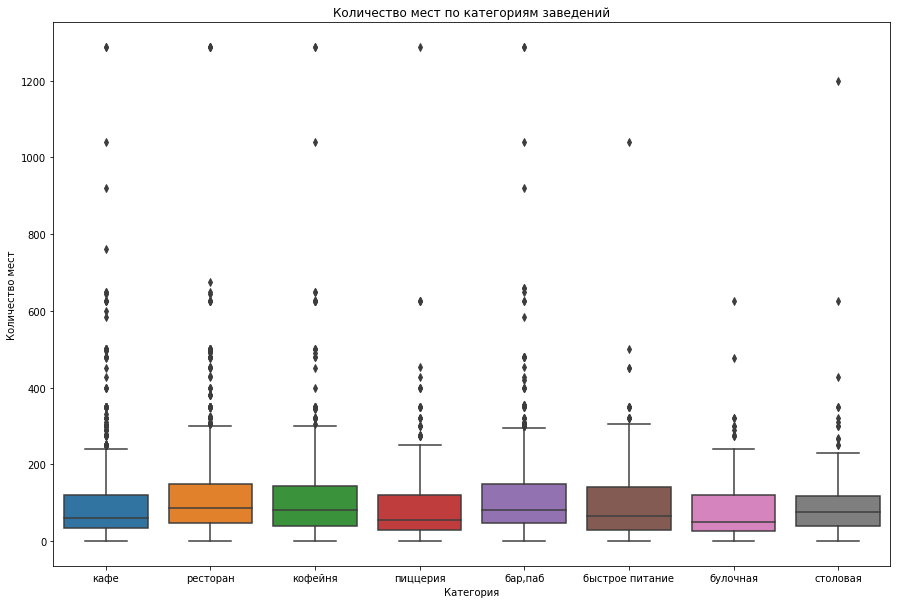

In [13]:
plt.figure(figsize=(15, 10))
ax = sns.boxplot(x='category', y='seats', data=places)
ax.set_title('Количество мест по категориям заведений')
ax.set(xlabel='Категория', ylabel='Количество мест');


Наблюдается значительное количество выбросов по всем категориям до 1200 мест. Максимальное значение среди кофеен и ресторанов около 360 мест, далее лучше использовать медианные значения.

In [15]:
fig = px.bar(seats_median, x='category', y='seats')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Медианное количество посадочных мест по категориям', title_x=0.5, 
                   xaxis_title='Категории',
                   yaxis_title='Количество посадочных мест')

fig.show()

**Вывод**
```
Медианное количество посадочных мест по категориям пледставлено следующим образом:
Наибольшее медианное количество мест:
    рестораны - 86 
    бар, паб - 82 
    кофейня - 80 

```

**Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**

In [17]:
fig = go.Figure(data=[go.Pie(labels=net['index'], values=net['chain'])])
fig.update_layout(title='Cоотношение сетевых и несетевых заведений', title_x=0.5,
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, y=1.05, showarrow=False)])
fig.show()

**Вывод**
```
Соотношение сетевых и несетевых заведений следующие:
Несетевые заведения	составляют - 61,9% от общего числа 
Сетевые заведения соствляют - 38,1%
Примерно, несетевых заведений на 40% больше, чем сетевых.
```

**Какие категории заведений чаще являются сетевыми?**

In [21]:
fig = px.bar(net_category.sort_values(by='share', ascending=False), x='category', y='share')
# fig.update_xaxes(tickangle=45)
fig.update_layout(title='Доля сетевых заведений в категории', title_x=0.5, 
                   xaxis_title='Категории',
                   yaxis_title='Доля от количества заведений в категории')

fig.show()

**Вывод**
```
Чаще всего сетевыми заведениями являются: булочная, пиццерия, кофейня.
Или если булочная, то скорее всего она будет сетевой, так как в этой категории чуть более 60% заведений относятся к сетевым. 
```

**Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?**

In [24]:
fig = px.bar(top_places.head(15).sort_values(by='name', ascending=False), x='index', y='name')
# fig.update_xaxes(tickangle=45)
fig.update_layout(title='ТОП-15 сетевых заведений', title_x=0.5, 
                   xaxis_title='Название сети',
                   yaxis_title='Количество заведений в категории')

fig.show()

**Вывод**
```
ТОП-15 сетевых заведений следующий:
1. Шоколадница
2. Домино'с Пицца
3. Додо Пицца
4. One Price Coffee
5. Яндекс Лавка
6. Cofix
7. Prime    
9. Кулинарная лавка братьев Караваевых
10. Теремок
11. Чайхана 
12 CofeFest
13 Буханка
14 Му-Му
15 Drive Café

Наиболее распространенные категории у данных сетей - кофейня, ресторан, пиццерия.
Общее у них - это ценовой сегмент - средний.
```

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [28]:
district_total = places.pivot_table(index='district', columns= 'category', values='name', aggfunc='count')
district_total['total_count']=district_total[['бар,паб','булочная','быстрое питание', 
                                              'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis='columns')
district_total.reset_index()




category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total_count
0,Восточный административный округ,53,25,71,272,105,72,160,40,798
1,Западный административный округ,50,36,62,238,150,71,218,24,849
2,Северный административный округ,68,39,58,235,193,77,187,41,898
3,Северо-Восточный административный округ,62,28,82,269,159,68,181,40,889
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
5,Центральный административный округ,364,50,87,464,428,113,670,66,2242
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
8,Южный административный округ,68,25,85,264,131,73,202,44,892


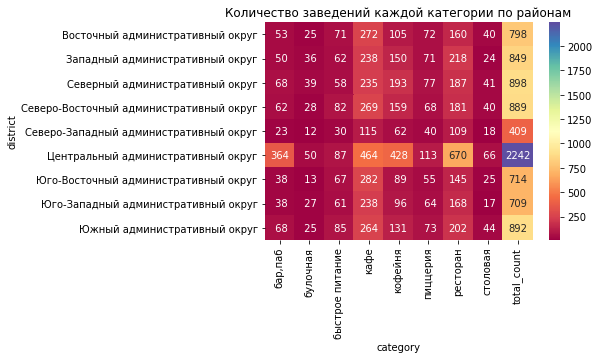

In [29]:
sns.heatmap(district_total, annot=True, cmap='Spectral', fmt='3g')
plt.title('Количество заведений каждой категории по районам') 
plt.show()


<div> 
<b>Вывод:</b> 

Наибольшее число завдений по всем категориям:
    
    в ЦАО - 2242
    в САО - 898
    в ЮАО - 892
Наименее насыщенный раон по количеству заведений - СЗАО-409 шт.

Отметим, что как правило, распределение числа категорий заведений внутри каждого района имеет схожие распределение.
То есть в каждом районе больше всего кафе, затем рестораны и кофейни.  


**Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.**

In [35]:

# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m



**Вывод** Ожидаемо, в центральном АО наибольшее количество заведений общепита.

**Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [38]:
fig= px.bar(join_top.sort_values(by='count', ascending=True), 
           x='cnt',
           y='street',
           text='cnt',
           color='category', barmode = 'stack')

fig.update_layout(title='Количество заведений по категориям на ТОП-15 улицах',
                 xaxis_title='Количество заведений по категориям',
                 yaxis_title='Названия улиц')

fig.show()

**Вывод** ТОП-15 улиц по количеству заведений - это наиболее протяженные шоссе, такие как пр.Мира, Профсоюзная, Ленинградский проспект

**Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**

In [45]:
# медиана столбца middle_avg_bill по районам. Отметим, что в столбце указано число, без диапазона. 
median_check_district=places.pivot_table(index='district', 
                                         values='middle_avg_bill',
                                         aggfunc='median').sort_values(by='middle_avg_bill', ascending=False).reset_index()
median_check_district


,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [46]:
mp = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=median_check_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color= 'YlOrRd',
    fill_opacity=0.5,
    legend_name='Медианный средний чек в заведения по районам',
).add_to(mp)
# выводим карту
mp

### Общий вывод по разделу

<b>Распределение по районам</b>

В Москве 8400 заведений. Отметим, что в Центрально АО сконцентрировано наибольшее количество заведений и составляет около 40% всего предложения в городе.

<u>Cредний чек</u>

Самый высокий средний чек (1000р) в центрально и западном АО. Центральный округ является туристической и деловой частью города, а также недвижимость в центральном округе более высокая по стоимости, т.к. имеет высокий инвестиционный потенциал. Средний чек в заведениях общественного питания является следствием этих факторов. 

В Западном АО исторически сложилось, что в этом районе строят ЖК премиум класса, для населения с доходом выше среднего. Как следствие, заведения общественного питания формируют более дорогое предложение. В этот округ попал аэропорт Внуково. Известно, что в аэропортах стоимость блюд чуть ли не выше ресторанов в центре города.

Наименьший средний чек (450-500р) в Юго-Восточный и Южный административных округах. Это обусловлено тем, что там расположена большая производственная часть города (например: тепло станция Капотня, Московский нефтеперерабатывающий завод, международный автовокзал, рынок Садовод). Еще в 60-х годах, когда только построили МКАД и присоединили новые территории за пределами Садового кольца, Юго-Восточный и Южный административных округах располагались самые настоящие деревни и поселки: Марьино, Люблино, поместье Кузьминки. Город рос и застраивался, а люди не поменялись.

Согласно карте выше, удаленность от центра не являет ключевым фактором влияющим на средний чек в заведении. Средничй чек заведения определяет район расположения.

<u>Средний рейтинг</u>

Средний рейтинг вех заведений, по всем районам выше 4 баллов. Но тем не менее в ЦАО рейтинг заведений выше, т.к. несмотря на высокий средний чек, посетители в первую очередь оценивают качество и сервис в заведении, а потом соотносят их со стоимостью. В ЦАО посетители склонны платить в среднеем 1000р за посещения за данное качество блюд.


<b>Популярные категории заведений</b>

    Наиболее распространенные категории заведений: 
    кафе - 2378 ед.
    рестораны - 2043 ед.
    кофейня - 1413 ед.

    Менее распространенные категории заведений:
    булочная - 256 ед.
    столовая - 315 ед.
    быстрое питание - 603 ед.
    
<b>Медианное количество посадочных мест по категориям заведений</b>   

    рестораны - 86 
    бар, паб - 82 
    кофейня - 80
    столовая	75.5
    быстрое питание	65.0
    кафе	60.0
    пиццерия	55.0
    булочная	50.0

<b>Принадлежность к сети</b>   

В целом по городу более 60% заведений являются сетевыми.
Чаще всего сетевыми заведениями являются: булочная, пиццерия, кофейня.
Или если булочная, то скорее всего она будет сетевой, так как в этой категории чуть более 60% заведений относятся к сетевым.
А вот бар, паб скорее всего будет единичным заведением, так как количество сетей в этой категории чуть более 20%.

    ТОП-15 сетевых заведений следующий:
    1. Шоколадница
    2. Домино'с Пицца
    3. Додо Пицца
    4. One Price Coffee
    5. Яндекс Лавка
    6. Cofix
    7. Prime    
    9. Кулинарная лавка братьев Караваевых
    10. Теремок
    11. Чайхана 
    12 CofeFest
    13 Буханка
    14 Му-Му
    15 Drive Café

Наиболее распространенные категории у данных сетей - кофейня, ресторан, пиццерия.
Общее у них - это ценовой сегмент - средний.

## Детализация исследования для открытия кофейни <a id="open"></a> 

Проведем исследование по следующим параметрам:


- количество всего кофеен в датасете;
- особенности их расположения;
- график работы;
- количество посадочных мест;
- средний чек;
- средняя стоимость чашки кофе.


## Рекомендации для открытия нового заведения <a id="new_cafe"></a> 

Кофейня - предприятие общественного питания, специализирующееся на изготовлении и реализации с потреблением на месте широкого ассортимента горячих напитков из кофе, какао и чая, мучных блюд и мучных булочных и кондитерских изделий, кулинарной продукции из полуфабрикатов высокой степени готовности в ограниченном ассортименте, а также алкогольных напитков и покупных товаров.

Заказчик вдохновлен идеей Central Park cafe. 
Предполагается, что ее адрес находится между 10-й и 11-й улицами. Однако на основе популярного ситкома в Нью-Йорке присутствует точная копия, называемая “Кафе Central Perk” расположенная примерно там же. 

Таким образом, рекомендации по открытию заведения будут следующие:

<u>Концепция заведения</u>

“Кафе Central Perk” копирующее заведение из ситкома "Друзья".
Стилистика помещения. Официанты в образе героев сериала.
Периодически разыгрываются сценки из сериала.
Для тех кто, пришел отметить свой праздник специальный кофе-брейк от "Моники".
Утренний кофе от "Рейчел"
Помещение зонировано на 3 части: "Джо", "Моника", "Фиби". В каждой зоне свои правила поведения и посещения. 
    
<u>Расположение</u>

Сложно делить Москву по районам с точки зрения бизнеса, так как главный критерий - это транспортная доступность, которая определяется магистралями. Поэтому рекоммендуем любую улицу в пределах ТТК.
Удаленность от метро не более 10 мин пешком или 500-700 метров.
Для данной концепции привязка к ТЦ или БЦ желательна, чтобы обеспечить постоянный спрос в течении всего дня. 

При наличии возможности,с т.з. аренды и доступных площадей,в ЦАО рекомендуем ориентироваться на бульварное кольцо, т.к. это прогулочная зона с хорошей доступностью от метро в любой части кольца. Стоит отметить, что именно кофеен на бульваре менее 10шт. при общем количестве заведений общественного питания более 100 шт. 

Важно отметить, что при данной концепции локация должна быть удобной, но не обязательно быть в особенно людном месте, т.к. заведение будет популярно у фанатов ситкома. А любителей сериала достаточно много. Например, толко в Москве этот сериал ищут/скачивают не менее 2000 раз/мес. (по статистике wordstat).
По А также формат заведения будет привлекать внимание, чтобы зайти туда специально.

<u>График работы</u>

если кафе будет расположено поблизости с БЦ, то рекомендуем 

    гафик работы:
    пн-чт: 8:00-22:00
    сб-вс: 11:00-22:00

если заведение удалено от БЦ или ТЦ, то 

    гафик работы:
    пн-вс: 11:00-22:00    
    
<u>Количество посадочных мест</u>    

Среднее количество посадочных мест для кофеен от 60 до 80.


<u>Средний чек</u>  

Медианный средний чек в ЦАО - 500р, а средний 794р. Предлагаю, чтобы средний чек был в диапазоне 500-800р.
При этом средняя стоимость чашки кофе - 190р. За 320р можно предлагать какой-то особенный литр кофе)


<u>Рекламно-маркетинговая активность</u>  

Цель рекламной кампании при открытии заведения - максимальный охват.
Целевая аудитория - 35-50 лет, те кто в свои ~20 лет любил МТV и культовый сериал "Друзья"
Одной из фишек при открытии может быть бесплатная чашка кофе от "Гантера" ))

Презентация v2: <https://drive.google.com/file/d/11wOjL9JFTZq_iA6yJEZlwPyFOYtIHXY2/view?usp=sharing> 